<a href="https://colab.research.google.com/github/Philip-v-E/Dress-Pattern-Marketing/blob/main/AI_Assignment_Philip.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **AI Assignment: create multimodal AI application**
By: Philip Engelen

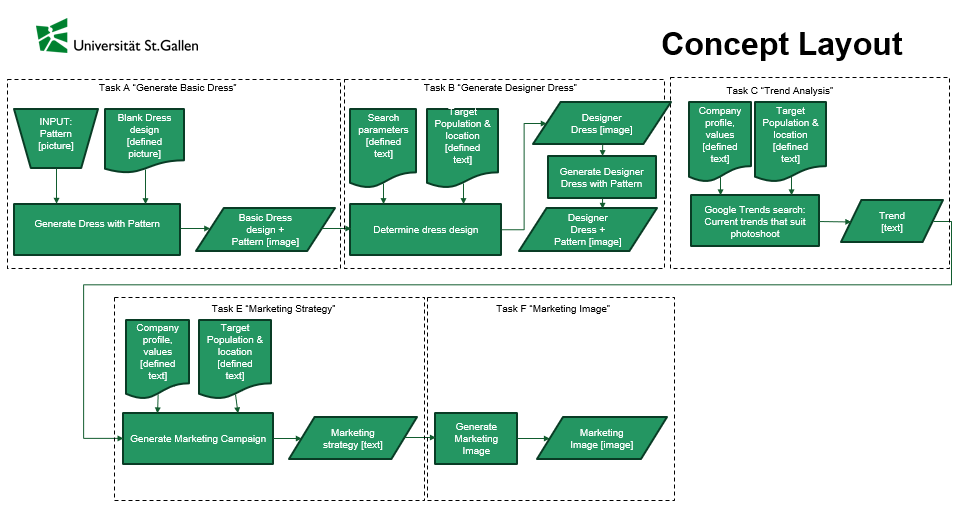

## **Setup**
Setting up the model (Copy from Exam.jpynb)

In [9]:

!pip install -qU \
    langchain \
    langchain-openai \
    langchain-community \
    langchain-core \
    langchain-huggingface \
    langchain-google-genai \
    openai

from google.colab import userdata
from langchain_core.prompts import PromptTemplate
from langchain_huggingface import ChatHuggingFace, HuggingFaceEndpoint
from langchain_core.runnables import RunnablePassthrough
from langchain_core.output_parsers import StrOutputParser
from langchain_community.utilities import GoogleSerperAPIWrapper
from langchain_openai import ChatOpenAI
import os
import pprint
import getpass
from IPython.display import Markdown
import IPython.display as ipd
from PIL import Image as PILImage
import urllib.request

# Added in addition:
import io
import requests
import base64
import glob
import time
from openai import OpenAI
from google.colab import drive
from datetime import datetime
from langchain_core.messages import HumanMessage
from IPython.display import Image, display

**NOTE on Error:** I get following error when running (seams an issue with API). The error does not effect on running the program.

*ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests==2.32.4, but you have requests 2.32.5 which is incompatible.
transformers 5.0.0 requires huggingface-hub<2.0,>=1.3.0, but you have huggingface-hub 0.36.2 which is incompatible.*

**Loading the required API's and defining models**

In [10]:
os.environ["OPENAI_API_KEY"] = userdata.get('OPENAI_API_KEY')
OpenAIClient = OpenAI()
llm_text = ChatOpenAI(model="gpt-4.1", temperature=0)
llm_vision = ChatOpenAI(model="gpt-4o", temperature=0.7)

os.environ["SERPER_API_KEY"] = userdata.get('SERPER_API_KEY')
search_tool = GoogleSerperAPIWrapper()

# os.environ["HF_TOKEN"] = userdata.get('HF_TOKEN')

**Mounting Google Drive**
  
  **NOTE:** I will generate multiple folders in Google Drive. Therefore access to the Google Drive is needed.  
  The reason is for debugging and also for tracing the individual generated information
  * /content/drive/MyDrive/AI_Philip-v-E/Basic_Dress_Designs/
  * /content/drive/MyDrive/AI_Philip-v-E/DesignDress/
  * /content/drive/MyDrive/AI_Philip-v-E/MarketingImages/
  * /content/drive/MyDrive/AI_Philip-v-E/MarketingStrategy/

In [11]:
drive.mount('/content/drive')
BASE_DRIVE_PATH = "/content/drive/MyDrive/AI_Philip-v-E/"

BasicImagePath = os.path.join(BASE_DRIVE_PATH, "Basic_Dress_Designs/")
DesignDressPath = os.path.join(BASE_DRIVE_PATH, "DesignDress/")
MarketingStrategyPath = os.path.join(BASE_DRIVE_PATH, "MarketingStrategy/")
MarketingImagesPath = os.path.join(BASE_DRIVE_PATH, "MarketingImages/")
MarketingVideoFolder = os.path.join(BASE_DRIVE_PATH, "MarketingVideos/")
MarketingImagesFolder = "MarketingImages"

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## **USER Input**

Defining the static URLs for the defined pictures of the Pattern and the basic dress

**NOTE**: the URL was changed from GitHub to import image:
* *gitbhub.com --> raw.githubusercontent.com *
* */blob/ --> removed*



---


Setting up the location of the dress and pattern URL.  
  
  **Used in:** Task A

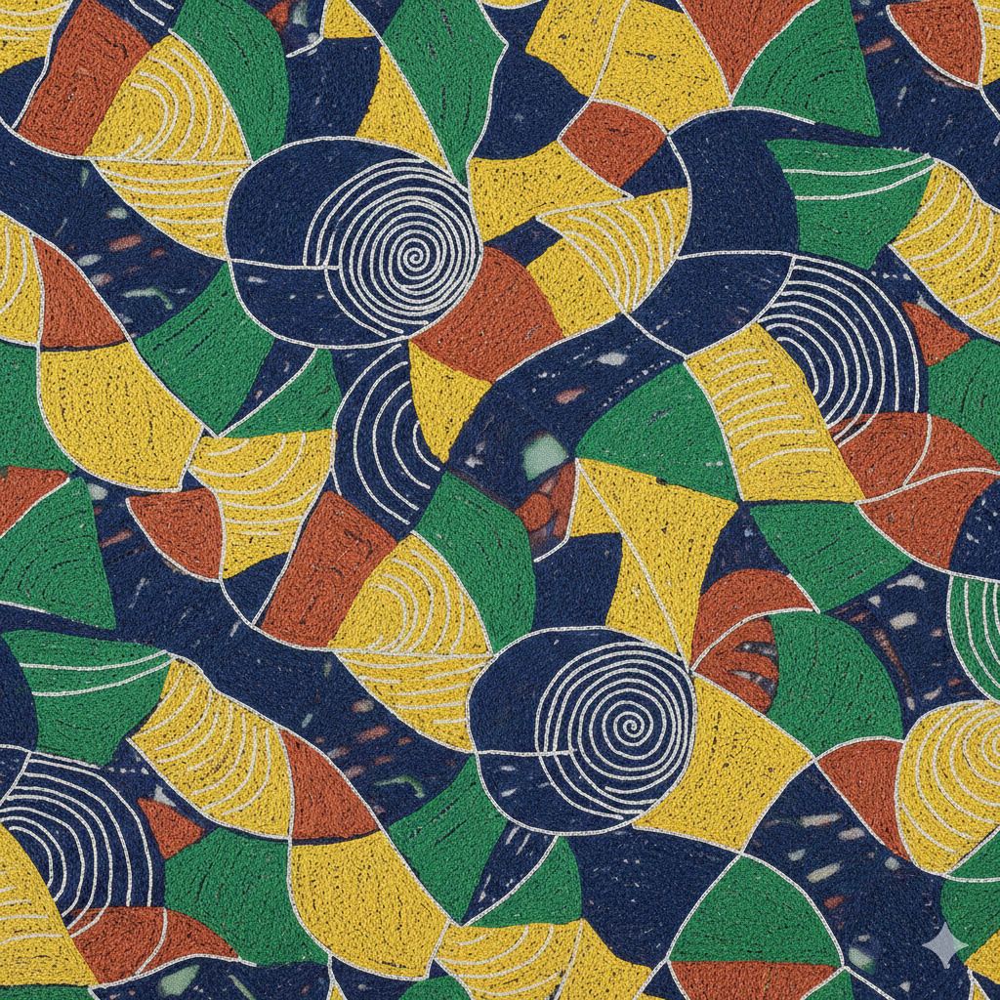

In [43]:
dress_url = "https://raw.githubusercontent.com/Philip-v-E/Dress-Pattern-Marketing/7b92fb0315af6ef39bda8cffef6dddfc05632850/Pre-Defined/Blank-dress-design.png"
#pattern_url = "https://raw.githubusercontent.com/Philip-v-E/Dress-Pattern-Marketing/4c590c59e9041dfbb892f48f34ac52dd68f09b14/Pre-Defined/Dress_pattern_01.png"
#pattern_url = "https://raw.githubusercontent.com/Philip-v-E/Dress-Pattern-Marketing/12cb38734327c9846928ae98e7a052fb7cdc9012/Pre-Defined/Dress_pattern_02.png"
pattern_url = "https://raw.githubusercontent.com/Philip-v-E/Dress-Pattern-Marketing/12cb38734327c9846928ae98e7a052fb7cdc9012/Pre-Defined/Dress_pattern_03.png"
# check if the url works
with urllib.request.urlopen(pattern_url) as url:
     img=PILImage.open(url)
     display(img)



---


The `promptBasicDress` is used to generate the `BasicDressImage`
  
  **Used in:** Task A

In [13]:
promptBasicDress="""
  Take the pattern from the url. The pattern size is 200x200mm.
  Take the dress from the url. Dress is for a 1700mm tall person
  Overlap the pattern onto the dress. Use dimensions for sizing.
  Output image should mentain the dress design, be photo realistic, preserce pattern in extreme detail, preserve colours, background required to be white
  """

The `DetermineDressDesign_Template` is used to generate the `DetermineDressDesign`  
  
  **Used in:** Task B

In [14]:
DetermineDressDesign_Template = PromptTemplate(
    input_variables=["company_profile"],
    template="""
        You are a expert fashion designer AI for the following company: {company_profile}

        Task:
        Determine what suitable dress design for 2026 would fit the pattern and style shown in this image.
        Please provide a highly detailed design specification, structured with the following headers:
          1. Silhouette & Structure: How should this basic shape be modernized for 2026? (e.g., asymmetrical cuts, structured draping, fluid lines).
          2. Hardware & Detailing: What modern accents (e.g., seamless zips) should be integrated?
        Ensure the design aligns with the company profile above.
        Return only the Task, NO COMMENTS
        Give me 3 specific designer instructions.
    """
)

In [15]:
TargetMarket="""
  Premium and avant-garde fashion designers based in Ghana and rapidly emerging African fashion capitals (such as Nairobi, Lagos, and Johannesburg).
  These designers cater to a growing demographic of young, affluent consumers (aged 25-40) and international luxury buyers who prioritize authenticity, zero-waste circular fashion, and cultural heritage.
  They specialize in high-end 'Afro-fusion'—expertly blending traditional West African motifs (like modernized Kente and Ankara) with ultra-premium imported materials to create structurally innovative, eco-conscious luxury garments for the 2026 global fashion week circuits.
  """

In [16]:
CompanyProfile=f"""
Brand Name: Swiss Fabric
Type: High-precision cottons & technical silks.
Target Market: {TargetMarket}
Value Proposition: Swiss quality durability mixed with vibrant, localized aesthetics.
Key Year: 2026 Season."""

In [17]:
SEO_Query_Prompt = PromptTemplate(
    input_variables=["market_profile"],
    template=(
        "You are an expert SEO researcher. Read the following target market profile:\n"
        "{market_profile}\n\n"
        "Write a highly optimized Google Search query (maximum 6 words) to find "
        "the latest 2026 fashion trends for this exact market. "
        "Output ONLY the search query text, without quotes or extra words."
    )
)

In [18]:
Marketing_Prompt_Template = PromptTemplate(
    input_variables=["company_profile", "trend_data"],
    template="""
        You are an expert luxury fashion marketer.
        I am providing you with:
        1. Our Company Profile: {company_profile}
        2. Live 2026 Trend Data: {trend_data}
        3. An image of our newly designed 2026 dress (attached).

        Task: Create a highly structured, compelling marketing campaign for this specific dress.
        Your output must include the following sections:
        - Campaign Title: A catchy, luxurious name for the campaign.
        - Target Audience Alignment: How this specific dress appeals to our defined market.
        - Trend Integration: Explicitly state how the design reflects the live 2026 trends provided.
        - Visual & Social Media Strategy: A 3-step plan for promoting the specific visual aesthetic of this dress on Instagram and TikTok.
    """
)

In [19]:
Visual_Extraction_Template = PromptTemplate(
    input_variables=["campaign_text"],
    template="""
        You are an expert AI image prompt engineer. Read this marketing campaign:
        {campaign_text}

        Task: Write a highly detailed image generation prompt (max 50 words).
        Describe a luxury fashion editorial photograph of a model wearing the dress.
        Focus on: Background (that works with the marketing campaign), lighting (that works with the marketing campaign), and mood.
        Requirement: DO NOT include any text, logos, or brand names in the image description.
    """
)

## **Funtion Templates**
Define Templates that are used to run actions through the Tasks

### **Generic Functions**



---

Funtion to save Images to Google Drive

In [20]:
def save_image_to_drive(b64_data, sub_folder, file_prefix):

    try:
        # Setup directory
        save_dir = os.path.join(BASE_DRIVE_PATH, sub_folder)
        if not os.path.exists(save_dir):
            os.makedirs(save_dir)

        # Create filename with timestamp
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        file_name = f"{file_prefix}_{timestamp}.png"
        full_path = os.path.join(save_dir, file_name)

        # Save decoded image
        with open(full_path, "wb") as f:
            f.write(base64.b64decode(b64_data))

        print(f"Image archived to Drive: {file_name}")

    except Exception as e:
        print(f"Save failed: {e}")



---

Fave text to Google Drive

In [21]:
def save_text_to_drive(text_content, target_folder, file_prefix="document"):

    try:
        # Ensure the target folder exists
        if not os.path.exists(target_folder):
            os.makedirs(target_folder)
            print(f" Created new directory: {target_folder}")

        # Generate a timestamped filename
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        file_name = f"{file_prefix}_{timestamp}.txt"

        # Construct the full save path
        full_path = os.path.join(target_folder, file_name)

        # Save the file
        with open(full_path, "w", encoding="utf-8") as f:
            f.write(text_content)

        print(f"\n\n Text successfully saved to: {full_path}")
        return full_path

    except Exception as e:
        print(f"Error saving text file: {e}")
        return None



---

Determine the Last saved image in folder

In [22]:
def get_latest_image (folder_path):
    # Search for all PNG files in the directory
    list_of_files = glob.glob(os.path.join(folder_path, '*.png'))

    if not list_of_files:
        print(f"No images found in {folder_path}")
        return None

    # Get the file with the most recent creation/modification time
    latest_file = max(list_of_files, key=os.path.getmtime)
    print(f"Latest image found: {latest_file}")
    return latest_file



---

Determine the last saved text file in folder

In [23]:
def get_latest_text_file(folder_path):
    """Searches for the most recently saved TXT file in the directory."""
    print(f"--- Scouting for latest AI analysis in: {folder_path} ---")

    # Search for all TXT files
    list_of_files = glob.glob(os.path.join(folder_path, '*.txt'))

    if not list_of_files:
        print(f"No text files found in {folder_path}")
        return None

    # Get the most recent text file
    latest_file = max(list_of_files, key=os.path.getmtime)
    print(f" Latest text found: {latest_file}")
    return latest_file



---

Read text from file

In [24]:
def read_text_from_file(file_path):
    """Opens a text file and returns its content as a string."""
    try:
        with open(file_path, "r", encoding="utf-8") as f:
            return f.read()
    except Exception as e:
        print(f"Error reading text file: {e}")
        return None

Save Output text to Google drive

In [25]:
def save_prompt_as_text(image_path, prompt_text):
    try:
        # generating the text file with the same naming as the used image filename
        txt_file_path = image_path.replace(".png", ".txt")

        # 2. Write the prompt text to the file
        with open(txt_file_path, "w") as f:
            f.write(prompt_text)

        print(f"\n\n Successfully saved prompt to: {txt_file_path}")
        return txt_file_path

    except Exception as e:
        print(f"Error saving text file: {e}")
        return None



---

Show the last image generated

In [26]:
import os
import glob
from PIL import Image as PILImage
from IPython.display import display

def show_latest_png(folder_path):
    # 1. Safety Check
    if not os.path.exists(folder_path):
        print(f"Error: Folder not found: {folder_path}")
        return

    # 2. Grab ALL .png files in that folder instantly
    search_pattern = os.path.join(folder_path, "*.png")
    png_files = glob.glob(search_pattern)

    # 3. Check if the folder is empty
    if not png_files:
        print(f" No .png images found in: {folder_path}")
        return

    try:
        # 4. Find the newest one based on modification time
        latest_file = max(png_files, key=os.path.getmtime)

        # 5. Display it
        print(f" Showing latest image: {os.path.basename(latest_file)}")
        img = PILImage.open(latest_file)
        display(img)

    except Exception as e:
        print(f"Error opening image: {e}")

### **Task specific Functions**



---

Generate the Basic Dress from input `dress_url` and `pattern_url`  
  
  **Used in:** Task A

NOTE: I used OpenAI Dall-E-3 version and the prompt returned a sub optimal picture. Therefore i changed to gpt-image-1.5. 2 updates, better responce quality and direct image URL input available.

In [27]:
def generateBasicDressImage(inputPrompt):
# 1. Download the images into memory as bytes
    dress_data = requests.get(dress_url).content
    pattern_data = requests.get(pattern_url).content
#   response = OpenAIClient.images.generate( --> didnt work
    response = OpenAIClient.images.edit(
      model="gpt-image-1.5",
      image=[
          ("dress.png", dress_data),
          ("pattern.png", pattern_data)
      ],
      prompt=inputPrompt,
      size="1024x1024",
      quality="high",
    )

    return response.data[0].b64_json



---


Determine the dress design suitable for the Basic Dress Image.  
  
  **Used in:** Task B

In [28]:
def DetermineDressDesign(image_path, text_prompt):
    if not image_path:
        return "Error: No image provided."

    try:
        # 1. Read the local image from Google Drive
        with open(image_path, "rb") as image_file:
            # since image is not public available it gets converted into base64
            base64_image = base64.b64encode(image_file.read()).decode('utf-8')

        print("--- Determining Dress design ---")

        # 2. Generating Responce
        response = OpenAIClient.responses.create(
            model="gpt-4.1",
            input=[{
                "role": "user",
                "content": [
                    {"type": "input_text", "text": text_prompt},
                    {"type": "input_image","image_url": f"data:image/png;base64,{base64_image}"},
                ],
            }],
            max_output_tokens=400
        )


        return response.output_text

    except Exception as e:
        return f"An error occurred during Vision analysis: {e}"



---

Generate the Image from the defined dress design `DetermineDressDesign`  
  
  **Used in:** Task B

In [29]:
def generateDressDesign(image_path, text_prompt):
    if not image_path:
        return "Error: No image provided."

    try:
        print("--- Generating Dress design ---")

        # 2. Generating Image from Image-to-Image transformation
        # added the "refined_prompt" because it was generating otherwise a picture with text.
        refined_prompt = (
            f"A professional, high-quality fashion photograph showing the final dress design based on these instructions: {text_prompt}. "
            "Crucial requirement: The final image must contain absolutely NO TEXT, NO LABELS, NO HUMAN, NO LIGAMENTS, NO FEET and NO WORDS superimposed on the photograph. "
            "Focus solely on the visual design, fabric, and tailoring. Background Transparent"
        )
        response = OpenAIClient.images.edit(
            model="gpt-image-1.5",
            image=open(image_path, "rb"),
            prompt=refined_prompt,
            size="1024x1024",
            quality="high",
        )

        return response.data[0].b64_json

    except Exception as e:
      print(f"An error occurred during generating image: {e}")
      return None



---


Generate a reduced Search Template using the LLM with input from the **USER Input** : `SEO_Query_Prompt`  
  
**Used in:** Task C

In [30]:
def analyze_fashion_trends_dynamically(target_market_text, llm, tool, prompt_template):

    print(f"--- Executing Trend Analysis ---")

    try:
        query_chain = prompt_template | llm | StrOutputParser()

        # Generate the optimized query
        optimized_query = query_chain.invoke({"market_profile": target_market_text})
        print(f"AI Generated Query: '{optimized_query}'")

        # Execute Search using query
        print("Fetching live results...")
        search_results = tool.run(optimized_query)

        return search_results

    except Exception as e:
        print(f"Error during Trend Analysis: {e}")
        return None



---


Generate the Marketing Strategy  
  
**Used in:** Task D  

In [31]:
def generate_marketing_strategy(image_path, text_prompt):

    print("--- Generating Marketing Strategy ---")

    if not image_path or not os.path.exists(image_path):
        return "Error: Image not found."

    try:
        with open(image_path, "rb") as image_file:
            base64_image = base64.b64encode(image_file.read()).decode('utf-8')

        message = HumanMessage(
            content=[
                {"type": "text", "text": text_prompt},
                {"type": "image_url", "image_url": {"url": f"data:image/png;base64,{base64_image}"}}
            ]
        )

        print("AI is analyzing the image and drafting the campaign...")
        response = llm_vision.invoke([message])
        return response.content

    except Exception as e:
        print(f"Error generating strategy: {e}")
        return None



---


Generate a Marketing Image  
  
  **Used in:** Task E

In [32]:
def generate_campaign_editorial_image(original_image_path, visual_prompt, client):

    print("--- Generating Marketing Image ---")

    if not os.path.exists(original_image_path):
        print(f"Error: Original image not found at {original_image_path}")
        return None

    try:
        Image_gen_prompt = f"Fashion editorial photoshoot: {visual_prompt}. Cinematic lighting, masterpiece. NO TEXT."

        # API Call (Using the client you initialized in Task B)
        response = OpenAIClient.images.edit(
            model="gpt-image-1.5",
            image=open(original_image_path, "rb"),
            prompt=Image_gen_prompt,
            quality="high",
            size="1024x1024",
            n=1
        )

        return response.data[0].b64_json

    except Exception as e:
        print(f"Error during image generation: {e}")
        return None

## **Task A "Generating Basic Dress**  

  This is the first step. Generate a generic looking dress from a predefined dress and pattern. Generating dress is used to normalize the input for the custom designed dress. In addition it also gives a comparison for other patterns.  
    
**Input** ( defined in *USER Input*):
*   Pattern url (`pattern_url`)
*   Basic dress url (`dress_url`)
*   Predefined text prompt to generate image (`promptBasicDress`)

**Funtion** (defined in *Funtion Template*):
* Generating "Basic Dress Image" `generateBasicDressImage`

**Execution**:
* `BasicDressImage`

**Outcome**: Dress with Pattern superimposed

In [44]:
BasicDressImage = generateBasicDressImage(promptBasicDress)

Saving the image in Google Drive in folder `Basic_Dress_Designs`

In [45]:
if 'BasicDressImage' in locals() and BasicDressImage:

    save_image_to_drive(
        b64_data=BasicDressImage,
        sub_folder="Basic_Dress_Designs",
        file_prefix="basic_dress"
    )

else:
    print("No image data found to save.")

Image archived to Drive: basic_dress_20260223_122202.png


**NOTE**:
base64 conversion needed as OpenAI outputs directly the image in base64 instead of the puting the image to an URL.  
Below is to see the generated image in Browser. Its not needed for executing further code.

 Showing latest image: basic_dress_20260223_122202.png


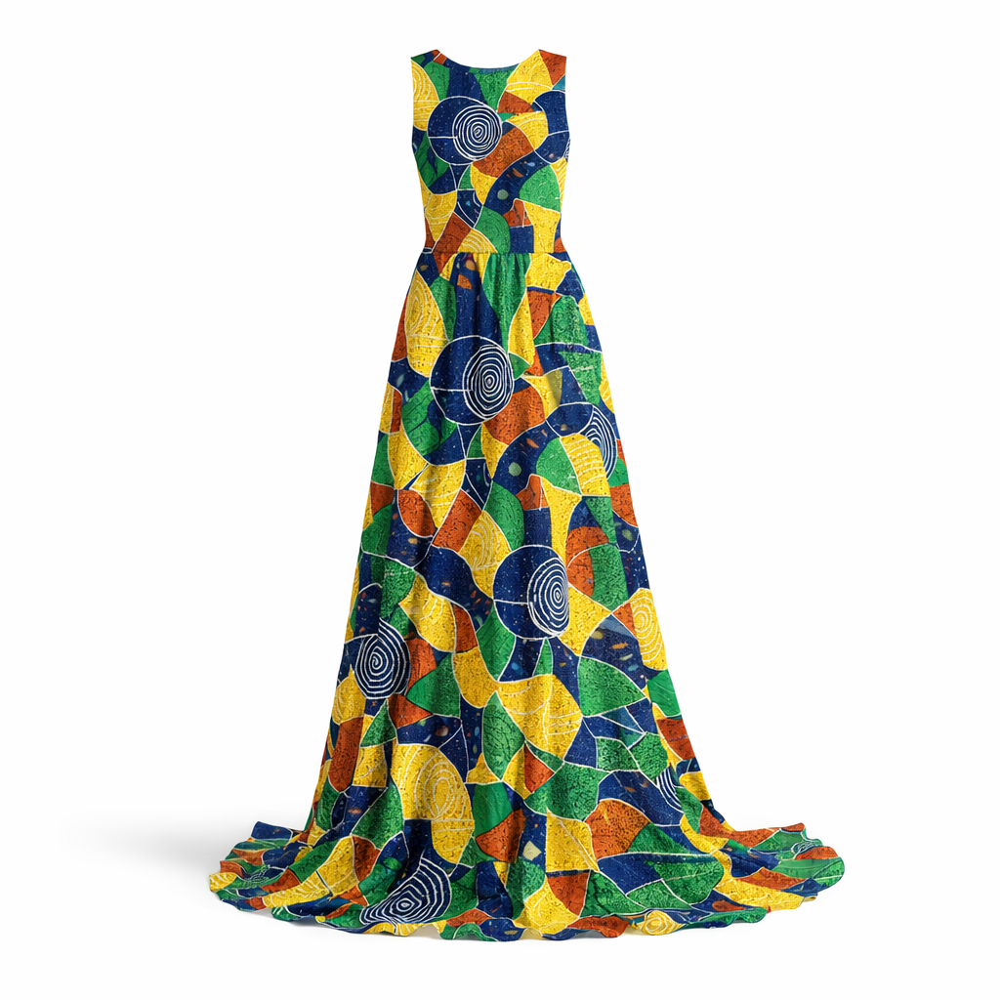

In [46]:
show_latest_png(BasicImagePath)

## **Task B "Generate Designer Dress"**

Perform an image search base on the generated Basic Dress with pattern to determine which designer type of dress is currently in fashion.  

**Input** ( defined in *USER Input*):
*   Predefined text prompt to generate text (`DetermineDressDesign_prompt`)

**Funtion** (defined in *Funtion Template*):
* Determine suitable Dress design `DetermineDressDesign`

**Execution**:
* `DressDesign_analysis`

**Outcome**: Dress with Pattern superimposed
Targeting specific customers *(location & population)* and specific Company values *(eliminating designs that does not fit in the company strategy)*

**Execute: Determine Dress Design**  
1. Find the last saved image of the Basic Dress Design using `retrieved_image_path`  
2. Determaning the Dress Design using `DressDesign_analysis` and generate a text based instruction for the design.  
3. Then safe the text output under the same name as the image used for the prompt, using `save_prompt_as_text`



In [47]:
# Ensure prerequisites are loaded
if 'CompanyProfile' in locals():

    # find the image last image saved in "/Basic_Dress_Designs/" folder
    BasicImagePath=os.path.join(BASE_DRIVE_PATH, "Basic_Dress_Designs/")
    retrieved_image_path = get_latest_image(BasicImagePath)

    # Only proceed if image is found
    if retrieved_image_path:

        # Inject the variables into the prompt template
        final_design_prompt = DetermineDressDesign_Template.format(
            company_profile=CompanyProfile
        )

        # Call the Vision function
        DressDesign_analysis = DetermineDressDesign(
            image_path=retrieved_image_path,
            text_prompt=final_design_prompt,
        )

        # Handle Output
        if DressDesign_analysis:
            print("\n=== AI Design Analysis ===\n")
            print(DressDesign_analysis)

            # Save Output Text
            saved_txt_path = save_prompt_as_text(
                image_path=retrieved_image_path,
                prompt_text=DressDesign_analysis
            )
        else:
            print("ERROR: AI failed to generate an analysis.")

    else:
        print("ERROR: Pipeline halted: Cannot proceed without a base design image.")

else:
    print(" Error: Missing 'CompanyProfile'. Please run the Company Profile cell first.")

Latest image found: /content/drive/MyDrive/AI_Philip-v-E/Basic_Dress_Designs/basic_dress_20260223_122202.png
--- Determining Dress design ---

=== AI Design Analysis ===

Task:

1. Silhouette & Structure:
   For 2026, modernize the classic A-line silhouette seen here by incorporating structured sculptural panels that create a subtle, shell-like asymmetry on one side of the skirt, echoing the garment’s circular motifs. Add a sharply contoured, single-shoulder neckline with an integrated draped cowl on the opposite collarbone for dynamic, directional appeal. Employ modular side vents at the base of the skirt with concealed closures to permit movement and reveal contrasting silk insets printed with refracted Kente motifs.

2. Hardware & Detailing:
   Integrate seamless, biodegradable zippers along the side seams for invisible closure and reduce bulk. Add hand-embroidered micro-beading along selected spiral motifs for textural contrast and subtle shimmer, using recycled glass beads sourced

**Execute: Generate Dress Design**

After generating the design responce `DressDesign_analysis` a image is generated from it.  
The image is than safed in a new folder `DesignDress`

**Execute**  
Image is safed in another folder to seperate outputs.

In [48]:
if 'BasicImagePath' in locals() and os.path.exists(BasicImagePath):

    # Get latest image and the latest text path
    retrieved_image_path = get_latest_image(BasicImagePath)
    retrieved_text_path = get_latest_text_file(BasicImagePath)

    # Proceed only if we found both ingredients
    if retrieved_image_path and retrieved_text_path:

        # Read the text contentn
        DressDesign_analysis_text = read_text_from_file(retrieved_text_path)

        if DressDesign_analysis_text:
            print(f"\n Loaded Instructions: {DressDesign_analysis_text[:100]}... (truncated)\n")

            # B. Generate the New Design
            designer_image_b64 = generateDressDesign(
                image_path=retrieved_image_path,
                text_prompt=DressDesign_analysis_text,
            )

            # Save
            if designer_image_b64:
                # Use your Universal Save Function
                save_image_to_drive(
                    b64_data=designer_image_b64,
                    sub_folder="DesignDress",
                    file_prefix="designer_dress"
                )

            else:
                print("Error: Generation failed.")
        else:
            print("Error: Could not read text from file.")

    else:
        print("Error: Pipeline Halted: Missing either the basic dress image or the text instructions.")

else:
    print("Error: 'BasicImagePath' is invalid or not defined.")

Latest image found: /content/drive/MyDrive/AI_Philip-v-E/Basic_Dress_Designs/basic_dress_20260223_122202.png
--- Scouting for latest AI analysis in: /content/drive/MyDrive/AI_Philip-v-E/Basic_Dress_Designs/ ---
 Latest text found: /content/drive/MyDrive/AI_Philip-v-E/Basic_Dress_Designs/basic_dress_20260223_122202.txt

 Loaded Instructions: Task:

1. Silhouette & Structure:
   For 2026, modernize the classic A-line silhouette seen here by ... (truncated)

--- Generating Dress design ---
Image archived to Drive: designer_dress_20260223_122529.png


 Showing latest image: designer_dress_20260223_122529.png


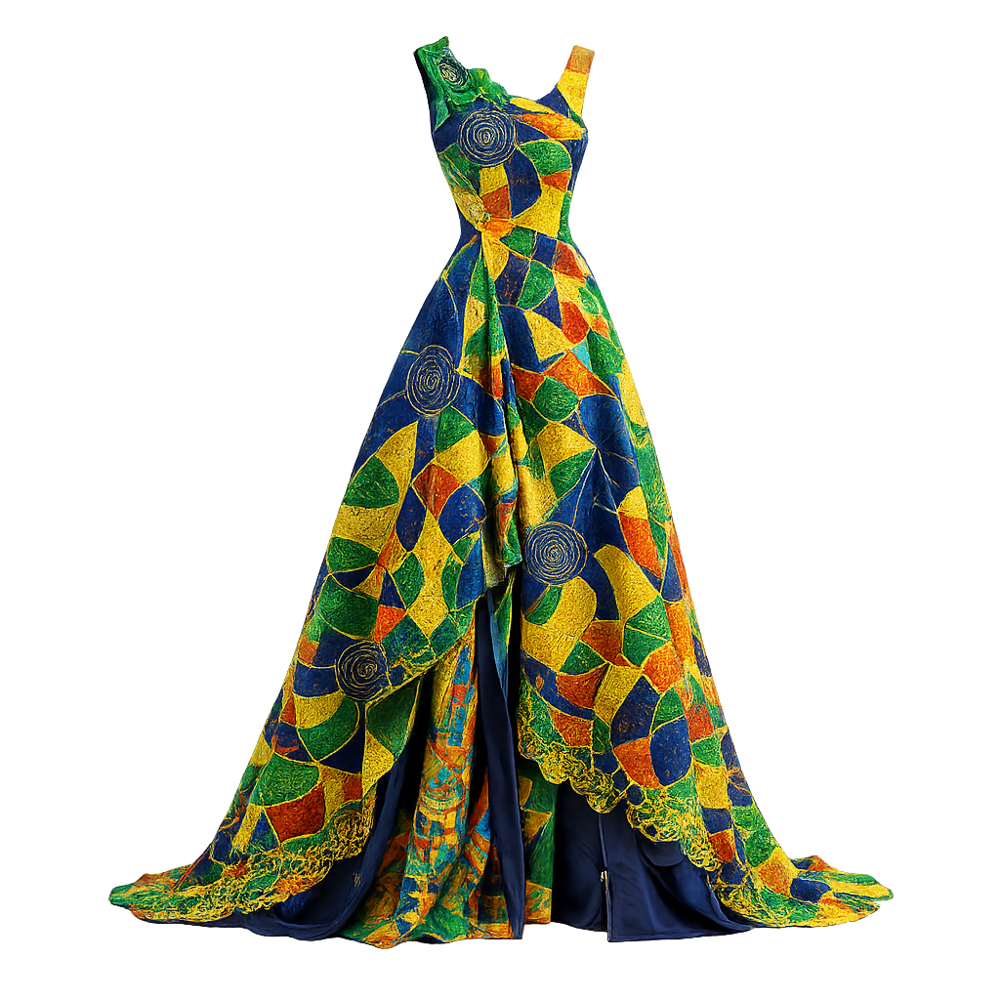

In [49]:
show_latest_png(DesignDressPath)

## **Task C "Trend Analysis"**  

Perform a Trend Analysis via the Google Serper. Using the text output from the Design Dress prompt.

**Input** ( defined in *USER Input*):
*   Promt Template to reduce input text for Google Serper. Using the prompt `SEO_Query_Prompt` for the LLM

**Funtion** (defined in *Funtion Template*):
* Read generated Dress Design Text from  `DressDesign_analysis`

**Execution**:
* `analyze_fashion_trends_dynamically`

**Outcome**: Trend data `live_trend_data`


In [50]:
# Check prerequisites
if 'BasicImagePath' in locals() and 'DesignDressPath' in locals():

    # Fetch latest Image and text
    latest_instructions_path = get_latest_text_file(BasicImagePath)
    latest_designer_image = get_latest_image(DesignDressPath)

    if latest_instructions_path and latest_designer_image:

        # Read the Design Instructions
        design_text_content = read_text_from_file(latest_instructions_path)
        print(f" Analyzing Design: {design_text_content[:100]}...")

        # Run the Trend Analysis
        live_trend_data = analyze_fashion_trends_dynamically(
            target_market_text=design_text_content,
            llm=llm_text,
            tool=search_tool,
            prompt_template=SEO_Query_Prompt
        )

        if live_trend_data:
            print("\n=== Live Trend Report ===")
            print(live_trend_data)

            # Save using your function!
            save_prompt_as_text(
                image_path=latest_designer_image,
                prompt_text=live_trend_data
            )

        else:
            print("Error: Trend analysis returned no data.")

    else:
        print("Error: Pipeline Halted: Missing either the Design Instructions (Task B) or Designer Image (Task C).")

else:
    print("Error: Error: Paths not defined.")

--- Scouting for latest AI analysis in: /content/drive/MyDrive/AI_Philip-v-E/Basic_Dress_Designs/ ---
 Latest text found: /content/drive/MyDrive/AI_Philip-v-E/Basic_Dress_Designs/basic_dress_20260223_122202.txt
Latest image found: /content/drive/MyDrive/AI_Philip-v-E/DesignDress/designer_dress_20260223_122529.png
 Analyzing Design: Task:

1. Silhouette & Structure:
   For 2026, modernize the classic A-line silhouette seen here by ...
--- Executing Trend Analysis ---
AI Generated Query: '2026 sculptural A-line African fashion trends'
Fetching live results...

=== Live Trend Report ===
New York Fashion Week Fall/Winter 2026 marked a return to tailoring, commerce and wearable design. From Prabal Gurung to Cult Gaia, ... From clean vertical panels to asymmetrical necklines and fluid skirts, each design is created to highlight curves without overwhelming them. Discover the hottest 2026 Ankara fashion trends in this stunning collection of beautiful African ... A-line flares, high-low hems Mu

## **Task D "Marketing Strategy"**

Perform a Marketing Strategy, using the text output from the Trend Analysis.

**Input** ( defined in *USER Input*):
*   Promt Template to generate the strategy  `Marketing_Prompt_Template`

**Funtion** (defined in *Funtion Template*):
* Generated Marketing Strategy  `generate_marketing_strategy`

**Outcome**: Marketing Campaign `marketing_campaign`

In [51]:
if 'CompanyProfile' in locals() and 'Marketing_Prompt_Template' in locals():

    # Fetch latest Image and text
    retrieved_image_path = get_latest_image(DesignDressPath)
    retrieved_trend_path = get_latest_text_file(DesignDressPath)

    if retrieved_image_path and retrieved_trend_path:

        # Read the latest trend data from the file
        live_trend_data = read_text_from_file(retrieved_trend_path)
        print("Successfully loaded Trend Data.")

        # Fill in the blanks of your template using .format()
        final_prompt_text = Marketing_Prompt_Template.format(
            company_profile=CompanyProfile,
            trend_data=live_trend_data
        )

        # Pass the retrieved path and filled-in prompt to your function
        marketing_campaign = generate_marketing_strategy(
            image_path=retrieved_image_path,
            text_prompt=final_prompt_text
        )

        # Handle the Output & Save
        if marketing_campaign:
            print("\n=== Marketing Campaign ===\n")
            print(marketing_campaign)

            # save the text
            saved_file = save_text_to_drive(
                text_content=marketing_campaign,
                target_folder=MarketingStrategyPath,
                file_prefix="Campaign_Strategy"
            )

        else:
            print(" Error: AI failed to generate a marketing campaign.")

    else:
        print("Error: Pipeline Halted: Missing either the Designer Image or the Trend Report.")

else:
    print("Error: Missing 'CompanyProfile' or 'Marketing_Prompt_Template'.")

Latest image found: /content/drive/MyDrive/AI_Philip-v-E/DesignDress/designer_dress_20260223_122529.png
--- Scouting for latest AI analysis in: /content/drive/MyDrive/AI_Philip-v-E/DesignDress/ ---
 Latest text found: /content/drive/MyDrive/AI_Philip-v-E/DesignDress/designer_dress_20260223_122529.txt
Successfully loaded Trend Data.
--- Generating Marketing Strategy ---
AI is analyzing the image and drafting the campaign...

=== Marketing Campaign ===

### Campaign Title: "Ethereal Heritage: The Kente Renaissance"

---

### Target Audience Alignment:

This dress is designed for avant-garde fashion designers and international luxury buyers who value authenticity and cultural heritage. The vibrant, modernized Kente pattern embodies a perfect blend of Swiss quality and African aesthetics, resonating with young, affluent consumers interested in eco-conscious, high-end fashion. The design speaks to those who appreciate the structural innovation and cultural storytelling unique to 'Afro-fusio

## **Task E "Marketing Image"**


Generate the Image from the last generated Designed Dress and Marketing Strategy

**Input** ( defined in *USER Input*):
* Designed Dress `designer_image_b64`
*   Marketing Strategy  `marketing_campaign`

**Funtion** (defined in *Funtion Template*):
* Generated Marketing Image  `generate_campaign_editorial_image`

**Outcome**: Marketing Image `campaign_image_data`

In [52]:
if 'marketing_campaign' in locals() and 'DesignDressPath' in locals():

    # Getch the latest image from Google Drive
    retrieved_image_path = get_latest_image(DesignDressPath)

    if retrieved_image_path:

        # Generate Text for Image prompt (Extracting a short visual brief from the long marketing strategy)
        visual_chain = Visual_Extraction_Template | llm_text | StrOutputParser()
        extracted_visual_prompt = visual_chain.invoke({"campaign_text": marketing_campaign})

        print(f" Extracted Visual Theme: {extracted_visual_prompt}\n")

        # Generate the Marketing Image
        campaign_image_data = generate_campaign_editorial_image(
            original_image_path=retrieved_image_path,
            visual_prompt=extracted_visual_prompt,
            client=OpenAIClient
        )

        # Save the Result
        if campaign_image_data:

            saved_img_path = save_image_to_drive(
                b64_data=campaign_image_data,
                sub_folder=MarketingImagesFolder,
                file_prefix="Marketing_Image"
            )

        else:
            print(" Error: Failed to generate the campaign editorial image.")

    else:
        print(f" Pipeline Halted: Could not find a designer dress in {DesignDressPath}")

else:
    print(" Error: Required variables 'marketing_campaign' or 'DesignDressPath' are missing.")

Latest image found: /content/drive/MyDrive/AI_Philip-v-E/DesignDress/designer_dress_20260223_122529.png
 Extracted Visual Theme: A striking editorial photograph of a model in a sculpted, asymmetrical Kente-inspired dress, standing in a minimalist, sunlit gallery with textured clay walls and lush green plants. Soft natural light highlights vibrant patterns and layered beadwork, evoking a mood of modern elegance and cultural reverence.

--- Generating Marketing Image ---
Image archived to Drive: Marketing_Image_20260223_122809.png


 Showing latest image: Marketing_Image_20260223_122809.png


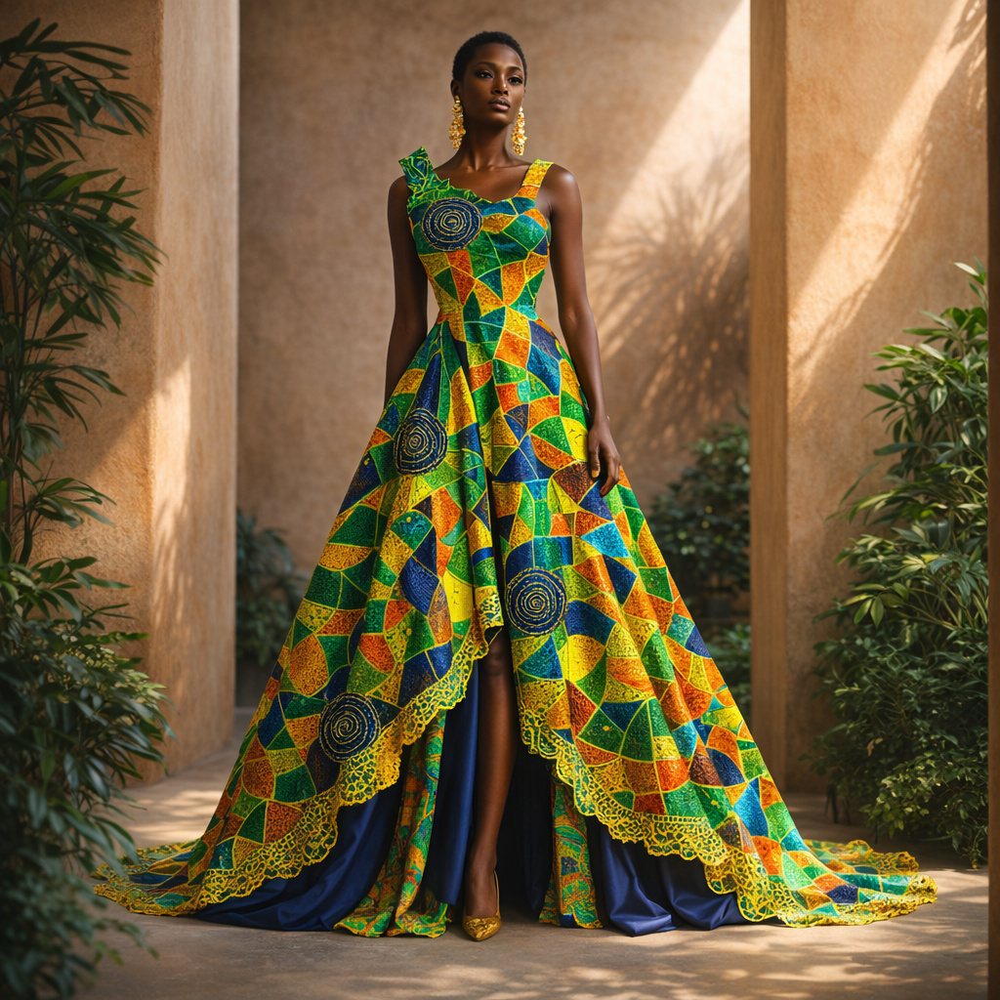

In [53]:
show_latest_png(MarketingImagesPath)